### Import the Libraries

In [3]:
from tqdm import tqdm
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import random
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

### Mounting the drive

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# Storing the path to the variable
project_path = '/content/drive/My Drive/Deep Learning/CNN/Dogs Breeds Classification/'

In [6]:
# Extracting the zip file
from zipfile import ZipFile
with ZipFile(project_path+'train.zip','r') as z:
  z.extractall()

In [7]:
# Loading the label dataset
labels = pd.read_csv(project_path+'labels.csv')

In [8]:
# First five rows
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Creating a empty lists to store the images and their labels
X_feature = []
y_feature = []


In [10]:
# Image input size for inceptionV3
img_height = 299
img_width = 299

In [11]:
# Load each images and resize them 
for f, img in tqdm(labels.values):
  train_img = cv2.imread('{}.jpg'.format(f),1)
  train_img_resize = cv2.resize(train_img,(img_width,img_height))
  X_feature.append(train_img_resize)
  y_feature.append(img)

100%|██████████| 10222/10222 [00:31<00:00, 322.03it/s]


In [12]:
# Considering only first 3500 images due to insufficient resources to train 
X_feature = X_feature[:3500]
y_feature = y_feature[:3500]

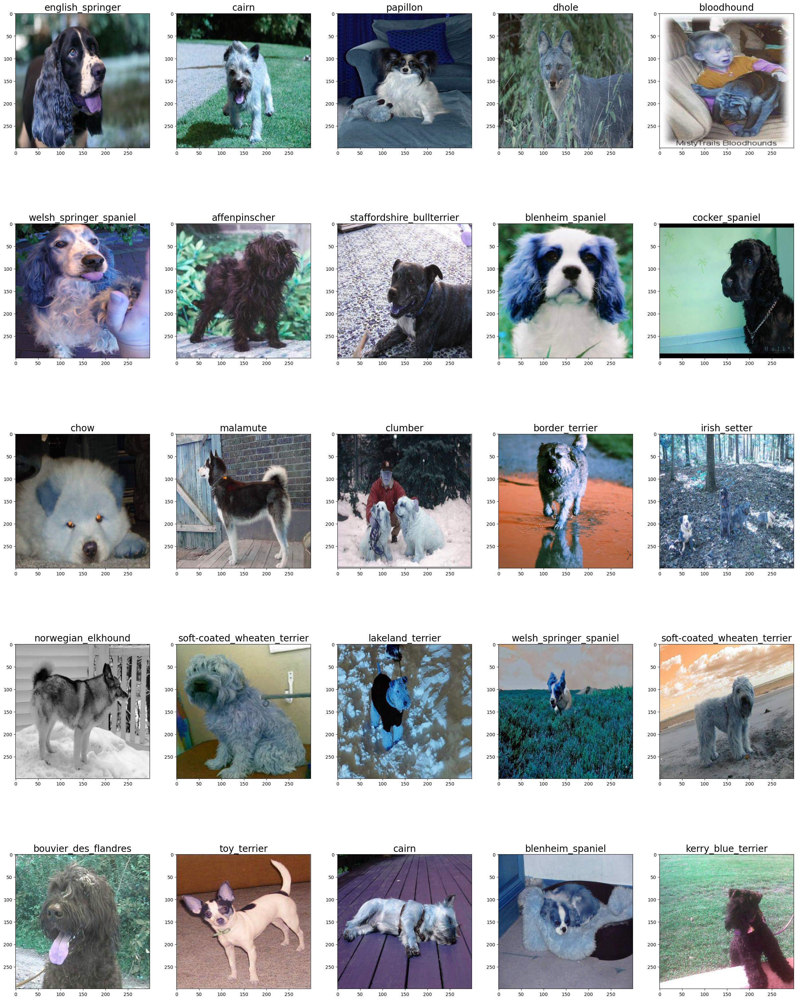

In [13]:
# ploting the 25 images 
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X_feature)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    image = X_feature[i]
    plt.imshow(image)
    plt.title(y_feature[i], fontsize=20)  
plt.show()


In [14]:

# Label and one-hot encoding y labels
le = LabelEncoder()
y = le.fit_transform(y_feature)
y_ohe = to_categorical(y, len(set(y_feature)))
y_ohe = np.array(y_ohe)

In [15]:
y_ohe.shape

(3500, 120)

In [16]:
y_ohe[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0.], dtype=float32)

In [17]:

# Spliting the data into train, test and validation
X_train, X_test, y_train, y_test = train_test_split(X_feature, y_ohe,
                                                   test_size = 0.2,
                                                   stratify=np.array(y_ohe), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 1) 

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 1)


In [18]:
X_train = np.array(X_train)

X_test = np.array(X_test)
X_val = np.array(X_val)

In [19]:
# Free up the space
import gc
del X_feature
gc.collect()

78283

In [20]:
# Preprocessing the images 
batch_size = 32

# Create train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(X_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(X_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)

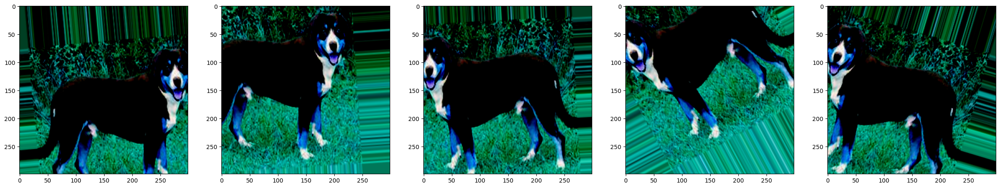

In [21]:
# Showing the 5 images
img_id = 16

dog_generator = train_datagen.flow(X_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs): 
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')
    
plt.show()

In [22]:
from keras import models
from keras import layers
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from keras.applications.inception_v3 import InceptionV3
from keras.utils.np_utils import to_categorical
from keras.utils.vis_utils import plot_model

# load InceptionV3 pre-trained model
base_model = InceptionV3(weights = 'imagenet', include_top = False, input_shape = (299,299,3))

model = models.Sequential()
model.add(base_model) # add pre_trained layers
model.add(GlobalAveragePooling2D())
#model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
model.add(Dropout(0.3))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(120, activation = 'softmax'))


# Freeze pre-trained layers
print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
model.layers[0].trainable = False
print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

87910968/87910968 [==============================] - 0s 0us/step
Number of trainable weights before freezing the base layer: 194
Number of trainable weights after freezing the base layer: 6


In [23]:
model.compile(Adam(lr=.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 120)               61560     
                                                        

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


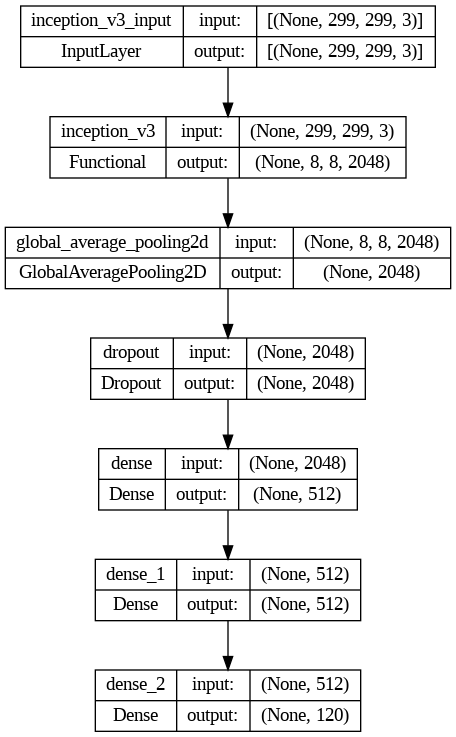

In [24]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [25]:
train_steps_per_epoch = X_train.shape[0] // batch_size
val_steps_per_epoch = X_val.shape[0] // batch_size
epochs = 20

history = model.fit_generator(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = epochs, verbose = 1)

<ipython-input-25-c799acecd07a>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/20
70/70 [==============================] - 65s 718ms/step - loss: 4.6615 - accuracy: 0.0491 - val_loss: 4.3431 - val_accuracy: 0.2518
Epoch 2/20
70/70 [==============================] - 51s 728ms/step - loss: 4.0718 - accuracy: 0.2513 - val_loss: 3.3900 - val_accuracy: 0.4651
Epoch 3/20
70/70 [==============================] - 49s 700ms/step - loss: 3.0462 - accuracy: 0.4228 - val_loss: 2.2350 - val_accuracy: 0.6048
Epoch 4/20
70/70 [==============================] - 59s 844ms/step - loss: 2.1405 - accuracy: 0.5482 - val_loss: 1.5830 - val_accuracy: 0.6599
Epoch 5/20
70/70 [==============================] - 49s 693ms/step - loss: 1.6298 - accuracy: 0.6201 - val_loss: 1.2269 - val_accuracy: 0.7114
Epoch 6/20
70/70 [==============================] - 52s 737ms/step - loss: 1.3598 - accuracy: 0.6531 - val_loss: 1.0715 - val_accuracy: 0.7279
Epoch 7/20
70/70 [==============================] - 50s 709ms/step - loss: 1.1991 - accuracy: 0.6777 - val_loss: 0.9683 - val_accuracy: 0.7445

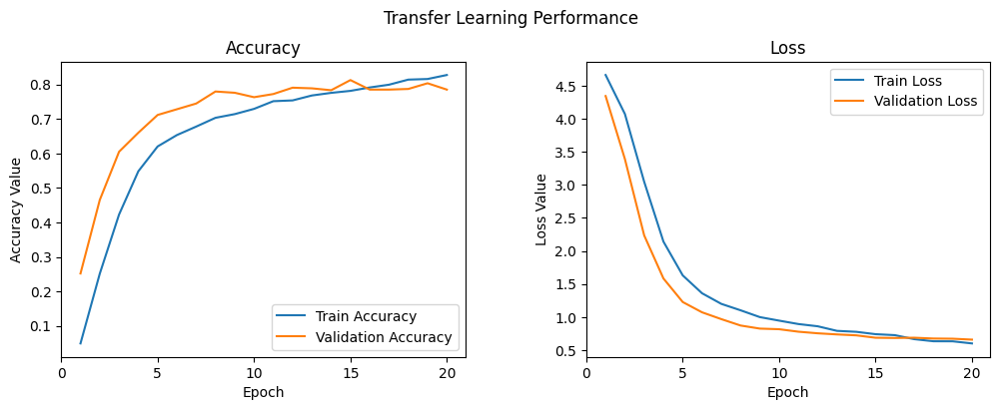

In [26]:

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Transfer Learning Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 5))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(np.arange(0, epochs+1, 5))
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")


In [28]:
x_test1 = X_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = model.predict(x_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] # get labels and reverse back to get the text labels
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)


22/22 [==============================] - 7s 253ms/step


,Target_Labels,Predictions
0,toy_terrier,toy_terrier
1,miniature_pinscher,miniature_pinscher
2,whippet,whippet
3,japanese_spaniel,japanese_spaniel
4,maltese_dog,maltese_dog
5,papillon,papillon
6,newfoundland,newfoundland
7,norwegian_elkhound,norwegian_elkhound
8,pug,pug
9,pug,pug


In [29]:

correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.7614285714285715


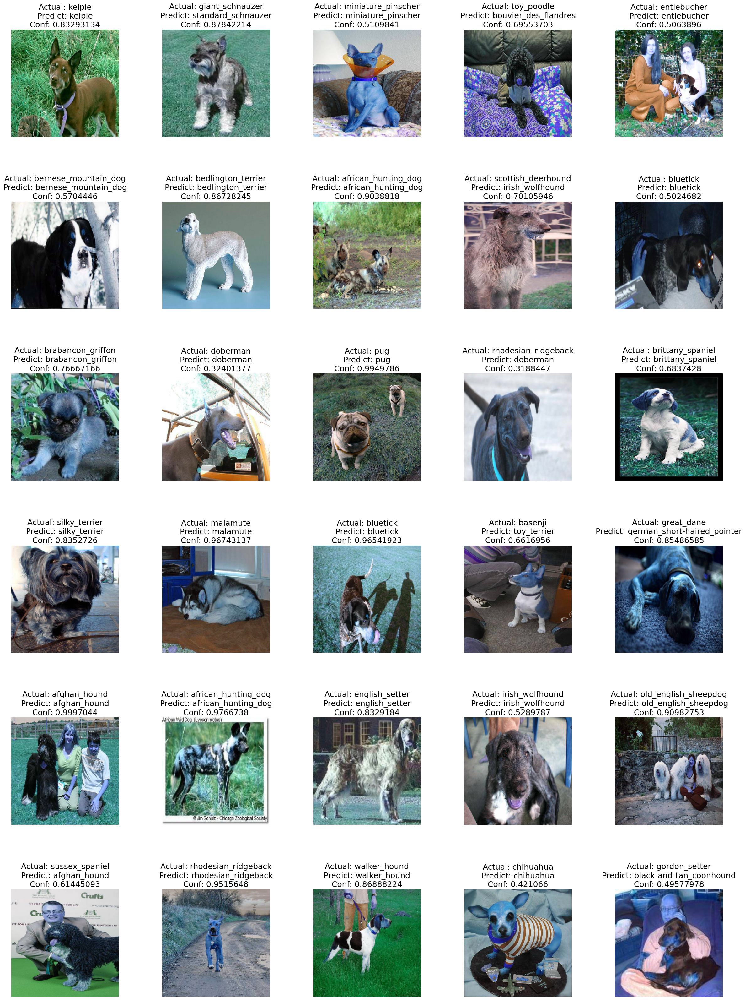

In [33]:
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(X_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()